In [1]:
rm(list=ls())
setwd("/scratch/AG_Ohler/CheWei/")

In [2]:
# Load libraries
suppressMessages(library(ggplot2))
suppressMessages(library(egg))
suppressMessages(library(ggtern))
suppressMessages(library(tidyverse))
suppressMessages(library(grid))
suppressMessages(library(patchwork))

Warning message:
“package ‘tibble’ was built under R version 4.1.1”
Warning message:
“package ‘tidyr’ was built under R version 4.1.2”
Warning message:
“package ‘readr’ was built under R version 4.1.2”


In [3]:
sessionInfo()

R version 4.1.0 (2021-05-18)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /fast/home/c/chsu/anaconda3/envs/tradeseq/lib/libopenblasp-r0.3.18.so

locale:
 [1] LC_CTYPE=en_US.utf-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.utf-8        LC_COLLATE=en_US.utf-8    
 [5] LC_MONETARY=en_US.utf-8    LC_MESSAGES=en_US.utf-8   
 [7] LC_PAPER=en_US.utf-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.utf-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] patchwork_1.1.1 forcats_0.5.1   stringr_1.4.0   dplyr_1.0.7    
 [5] purrr_0.3.4     readr_2.1.2     tidyr_1.2.0     tibble_3.1.6   
 [9] tidyverse_1.3.1 ggtern_3.3.5    egg_0.4.5       gridExtra_2.3  
[13] ggplot2_3.3.5  

loaded via a namespace (and not attached):
 [1] Rcpp

## Load the downloaded data from ARVEX

In [4]:
Dat_WT = read.csv("WT_All_SCT_celloracle_gene_score_iGRN.csv")
Dat_WT$cluster = gsub("^Distal ","Distal_",Dat_WT$cluster)
Dat_WT$cluster = gsub("^Proximal ","Proximal_",Dat_WT$cluster)
Dat = read.csv("All_SCT_celloracle_gene_score_iGRN.csv")
Dat$cluster = gsub("^Distal ","Distal_",Dat$cluster)
Dat$cluster = gsub("^Proximal ","Proximal_",Dat$cluster)
features =  read.csv("./features.tsv.gz", sep = "\t", header = FALSE)
umap_wt = read.csv("./atlas_gene_expression_data/WT_umap.csv.bz2")
anno_wt = read.csv("./atlas_gene_expression_data/WT_metadata.csv.bz2")
umap_shr = read.csv("./atlas_gene_expression_data/SHR_umap.csv.bz2")
anno_shr = read.csv("./atlas_gene_expression_data/SHR_metadata.csv.bz2")
umap_br = read.csv("./atlas_gene_expression_data/BR_umap.csv.bz2")
anno_br = read.csv("./atlas_gene_expression_data/BR_metadata.csv.bz2")
umap_bri = read.csv("./atlas_gene_expression_data/bri1-T_umap.csv.bz2")
anno_bri = read.csv("./atlas_gene_expression_data/bri1-T_metadata.csv.bz2")
umap_gtl = read.csv("./atlas_gene_expression_data/gtl1_df1_umap.csv.bz2")
anno_gtl = read.csv("./atlas_gene_expression_data/gtl1_df1_metadata.csv.bz2")

## BRZ BL

In [5]:
margin <- c(-50,-50,-50,-50)

In [6]:
dat_br = left_join(umap_br, anno_br, by="cell")

dat_br$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_br$time_zone)
dat_br$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_br$time_zone)
dat_br$cell_type = gsub("Lateral Root Cap","LRC",dat_br$cell_type)
dat_br$cell_type = gsub("Quiescent Center","QC",dat_br$cell_type)

#reorder factors
dat_br$time_zone = factor(dat_br$time_zone, levels=rev(c("Distal Columella","Proximal Columella","Distal LRC","Proximal LRC","Maturation","Elongation", "Transition Domain", "Proliferation Domain"))) 
dat_br$cell_type = factor(dat_br$cell_type, levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))

p1 <- dat_br %>% filter (name=="BRZ") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("BRZ")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("Cell Type")
p2 <- dat_br %>% filter (name=="BL 2 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(name="",values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("BL")+
        theme_classic()+
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)))+
        guides(colour = guide_legend(override.aes = list(size=3,alpha = 1)))+
        xlab("")+ylab("")
p3 <- dat_br %>% filter (name=="BRZ") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        ggtitle("BRZ")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("Developmental Stage")
p4 <- dat_br %>% filter (name=="BL 2 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(name="",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        ggtitle("BL")+
        theme_classic()+
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)))+
        guides(colour = guide_legend(override.aes = list(size=3,alpha = 1)))+
        xlab("")+ylab("")

BR_geneID <- "AT5G64620"
  
geneName <- features$V2[which(features$V1==BR_geneID)]
gene_br <- read.csv(paste0("./atlas_gene_expression_data/14S_BR_normdata_",BR_geneID,".csv.bz2"))
dat_br = left_join(umap_br, anno_br, by="cell")
dat_br = left_join(dat_br, gene_br, by="cell")%>%
 select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name = "name",time_zone="time_zone", cell_type="cell_type", NormExp=BR_geneID)) %>% 
 dplyr::mutate(across(NormExp, ~replace_na(.x, 0)))

min.cutoff <- as.numeric(quantile(dat_br$NormExp[which(dat_br$NormExp!=0)], 0.1)[1])
max.cutoff <- as.numeric(quantile(dat_br$NormExp[which(dat_br$NormExp!=0)], 0.9)[2])
min.idx <- which((dat_br$NormExp < min.cutoff) & (dat_br$NormExp!=0))
max.idx <- which((dat_br$NormExp > max.cutoff) & (dat_br$NormExp!=0))
if (length(min.idx)>0){
  dat_br$NormExp[min.idx]=min.cutoff
}
if (length(max.idx)>0){
  dat_br$NormExp[max.idx]=max.cutoff
}

dat_br$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_br$time_zone)
dat_br$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_br$time_zone)
dat_br$cell_type = gsub("Lateral Root Cap","LRC",dat_br$cell_type)
dat_br$cell_type = gsub("Quiescent Center","QC",dat_br$cell_type)

#reorder factors
dat_br$time_zone = factor(dat_br$time_zone, levels=rev(c("Distal Columella","Proximal Columella","Distal LRC","Proximal LRC","Maturation","Elongation", "Transition Domain", "Proliferation Domain"))) 
dat_br$cell_type = factor(dat_br$cell_type, levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))
dat_br$tc <- paste0(dat_br$time_zone,"_",dat_br$cell_type)
dat_br$ntc <- paste0(dat_br$name,"_",dat_br$tc)

normax <- max(dat_br$NormExp)

p5 <- dat_br %>% filter (name=="BRZ") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("BRZ")+  
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank())+
          theme(legend.position="none")+
        xlab("")+ylab("")
p6 <- dat_br %>% filter (name=="BL 2 hour") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax), name = paste0(geneName," Expression","\n","\nNormExp")) + theme_classic() + ggtitle("BL")+ xlab("")+ylab("")+ 
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
                axis.text.x = element_text(colour="white"),
                axis.ticks.y = element_blank(),
                axis.text.y = element_text(colour="white"),
                axis.line = element_blank(),
                legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)))

tzo <- c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation", "Proximal", "Distal")
cto <- rev(c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))

normax <- dat_br %>% group_by(ntc) %>% summarise(AvgExp = mean(NormExp))
normax <- max(normax$AvgExp) 

p7 <- dat_br %>% filter (name=="BRZ") %>% group_by(tc) %>% summarise(AvgExp = mean(NormExp), PctExp = length(which(NormExp > 0))/length(NormExp)) %>%
          mutate(time_zone = factor(gsub("_.*$","",tc),levels = tzo), cell_type = factor(gsub("^.*_", "", tc),levels = cto), AvgExp=AvgExp, PctExp=PctExp) %>% 
          select(c(time_zone, cell_type, AvgExp, PctExp)) %>% ggplot(aes(x=time_zone, y=cell_type))+ geom_point(aes(colour=AvgExp,size = PctExp)) + 
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000",limits=c(0,normax)) + theme_classic()+ ggtitle("")+ 
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.text.y  = element_text(size=rel(1.2)) , axis.text.x = element_text(size=rel(1.2), angle = 45, hjust=1), legend.title=element_text(size=rel(1.2)), legend.text=element_text(size=rel(1.2)))+
          theme(legend.position = "none") + xlab("") + ylab("")

p8 <- dat_br %>% filter (name=="BL 2 hour") %>% group_by(tc) %>% summarise(AvgExp = mean(NormExp), PctExp = length(which(NormExp > 0))/length(NormExp)) %>%
          mutate(time_zone = factor(gsub("_.*$","",tc),levels=tzo), cell_type = factor(gsub("^.*_", "", tc),levels=cto), AvgExp=AvgExp, PctExp=PctExp) %>% 
          select(c(time_zone, cell_type, AvgExp, PctExp)) %>% ggplot(aes(x=time_zone, y=cell_type))+ geom_point(aes(colour=AvgExp,size = PctExp)) + 
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000",limits=c(0,normax), name = paste0(geneName," Expression","\n","\nAvgExp")) + theme_classic()+ ggtitle("")+
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.text.y  = element_text(size=rel(1.2)) , axis.text.x = element_text(size=rel(1.2), angle = 45, hjust=1), legend.title=element_text(size=rel(1.2)), legend.text=element_text(size=rel(1.2)))+
          xlab("") + ylab("")

BR_geneID <- "AT2G22125"
  
geneName <- features$V2[which(features$V1==BR_geneID)]
gene_br <- read.csv(paste0("./atlas_gene_expression_data/14S_BR_normdata_",BR_geneID,".csv.bz2"))
dat_br = left_join(umap_br, anno_br, by="cell")
dat_br = left_join(dat_br, gene_br, by="cell")%>%
 select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name = "name",time_zone="time_zone", cell_type="cell_type", NormExp=BR_geneID)) %>% 
 dplyr::mutate(across(NormExp, ~replace_na(.x, 0)))

min.cutoff <- as.numeric(quantile(dat_br$NormExp[which(dat_br$NormExp!=0)], 0.1)[1])
max.cutoff <- as.numeric(quantile(dat_br$NormExp[which(dat_br$NormExp!=0)], 0.9)[2])
min.idx <- which((dat_br$NormExp < min.cutoff) & (dat_br$NormExp!=0))
max.idx <- which((dat_br$NormExp > max.cutoff) & (dat_br$NormExp!=0))
if (length(min.idx)>0){
  dat_br$NormExp[min.idx]=min.cutoff
}
if (length(max.idx)>0){
  dat_br$NormExp[max.idx]=max.cutoff
}

dat_br$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_br$time_zone)
dat_br$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_br$time_zone)
dat_br$cell_type = gsub("Lateral Root Cap","LRC",dat_br$cell_type)
dat_br$cell_type = gsub("Quiescent Center","QC",dat_br$cell_type)

#reorder factors
dat_br$time_zone = factor(dat_br$time_zone, levels=rev(c("Distal Columella","Proximal Columella","Distal LRC","Proximal LRC","Maturation","Elongation", "Transition Domain", "Proliferation Domain"))) 
dat_br$cell_type = factor(dat_br$cell_type, levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))
dat_br$tc <- paste0(dat_br$time_zone,"_",dat_br$cell_type)
dat_br$ntc <- paste0(dat_br$name,"_",dat_br$tc)

normax <- max(dat_br$NormExp)

p9 <- dat_br %>% filter (name=="BRZ") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("BRZ")+  
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank())+
          theme(legend.position="none")+
        xlab("")+ylab("")
p10 <- dat_br %>% filter (name=="BL 2 hour") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax), name = paste0(geneName," Expression","\n","\nNormExp")) + theme_classic() + ggtitle("BL")+ xlab("")+ylab("")+ 
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
                axis.text.x = element_text(colour="white"),
                axis.ticks.y = element_blank(),
                axis.text.y = element_text(colour="white"),
                axis.line = element_blank(),
                legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)))

tzo <- c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation", "Proximal", "Distal")
cto <- rev(c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))

normax <- dat_br %>% group_by(ntc) %>% summarise(AvgExp = mean(NormExp))
normax <- max(normax$AvgExp) 

p11 <- dat_br %>% filter (name=="BRZ") %>% group_by(tc) %>% summarise(AvgExp = mean(NormExp), PctExp = length(which(NormExp > 0))/length(NormExp)) %>%
          mutate(time_zone = factor(gsub("_.*$","",tc),levels = tzo), cell_type = factor(gsub("^.*_", "", tc),levels = cto), AvgExp=AvgExp, PctExp=PctExp) %>% 
          select(c(time_zone, cell_type, AvgExp, PctExp)) %>% ggplot(aes(x=time_zone, y=cell_type))+ geom_point(aes(colour=AvgExp,size = PctExp)) + 
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000",limits=c(0,normax)) + theme_classic()+ ggtitle("")+ 
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.text.y  = element_text(size=rel(1.2)) , axis.text.x = element_text(size=rel(1.2), angle = 45, hjust=1), legend.title=element_text(size=rel(1.2)), legend.text=element_text(size=rel(1.2)))+
          theme(legend.position = "none") + xlab("") + ylab("")

p12 <- dat_br %>% filter (name=="BL 2 hour") %>% group_by(tc) %>% summarise(AvgExp = mean(NormExp), PctExp = length(which(NormExp > 0))/length(NormExp)) %>%
          mutate(time_zone = factor(gsub("_.*$","",tc),levels=tzo), cell_type = factor(gsub("^.*_", "", tc),levels=cto), AvgExp=AvgExp, PctExp=PctExp) %>% 
          select(c(time_zone, cell_type, AvgExp, PctExp)) %>% ggplot(aes(x=time_zone, y=cell_type))+ geom_point(aes(colour=AvgExp,size = PctExp)) + 
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000",limits=c(0,normax), name = paste0(geneName," Expression","\n","\nAvgExp")) + theme_classic()+ ggtitle("")+
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.text.y  = element_text(size=rel(1.2)) , axis.text.x = element_text(size=rel(1.2), angle = 45, hjust=1), legend.title=element_text(size=rel(1.2)), legend.text=element_text(size=rel(1.2)))+
          xlab("") + ylab("")

Note: Using an external vector in selections is ambiguous.
ℹ Use `all_of(BR_geneID)` instead of `BR_geneID` to silence this message.
ℹ See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.
This message is displayed once per session.



In [7]:
margin2 <- c(0.5,0,0,0.5)

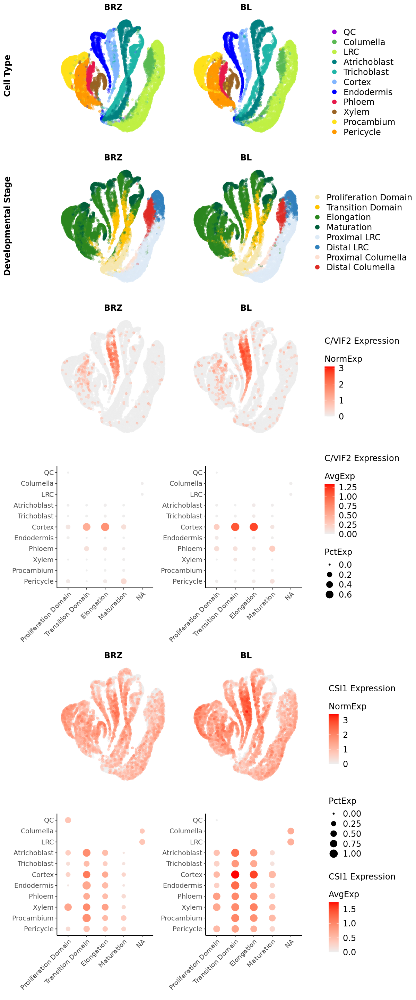

In [8]:
options(repr.plot.width=10, repr.plot.height=24)
(p1 + p2) / (p3 + p4)/ (p5 + p6)/ (p7 + p8)/ (p9 + p10)/ (p11 + p12) + plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))

In [9]:
pdf("BRZ_BL.pdf", height=24, width=10)
(p1 + p2) / (p3 + p4)/ (p5 + p6)/ (p7 + p8)/ (p9 + p10)/ (p11 + p12) + plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))
dev.off()

png 
  2

## BR time course

In [10]:
margin <- c(-50,-50,-50,-50)

In [11]:
dat_br = left_join(umap_br, anno_br, by="cell")

dat_br$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_br$time_zone)
dat_br$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_br$time_zone)
dat_br$cell_type = gsub("Lateral Root Cap","LRC",dat_br$cell_type)
dat_br$cell_type = gsub("Quiescent Center","QC",dat_br$cell_type)

#reorder factors
dat_br$time_zone = factor(dat_br$time_zone, levels=rev(c("Distal Columella","Proximal Columella","Distal LRC","Proximal LRC","Maturation","Elongation", "Transition Domain", "Proliferation Domain"))) 
dat_br$cell_type = factor(dat_br$cell_type, levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))

p1 <- dat_br %>% filter (name=="BRZ") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("BRZ")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("Cell Type")
p2 <- dat_br %>% filter (name=="BL 0.5 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("BL 0.5 hour")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("")
p3 <- dat_br %>% filter (name=="BL 1 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("BL 1 hour")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("")
p4 <- dat_br %>% filter (name=="BL 2 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("BL 2 hour")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("")
p5 <- dat_br %>% filter (name=="BL 4 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("BL 4 hour")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("")
p6 <- dat_br %>% filter (name=="BL 8 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(name="",values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("BL 8 hour")+
        theme_classic()+
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)))+
        guides(colour = guide_legend(override.aes = list(size=3,alpha = 1)))+
        xlab("")+ylab("")
p7 <- dat_br %>% filter (name=="BRZ") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        #ggtitle("BRZ")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("Developmental Stage")
p8 <- dat_br %>% filter (name=="BL 0.5 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        #ggtitle("BL 0.5 hour")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("")
p9 <- dat_br %>% filter (name=="BL 1 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        #ggtitle("BL 1 hour")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("")
p10 <- dat_br %>% filter (name=="BL 2 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        #ggtitle("BL 2 hour")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("")
p11 <- dat_br %>% filter (name=="BL 4 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        #ggtitle("BL 4 hour")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("")
p12 <- dat_br %>% filter (name=="BL 8 hour") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(name="",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        #ggtitle("BL 8 hour")+
        theme_classic()+
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)))+
        guides(colour = guide_legend(override.aes = list(size=3,alpha = 1)))+
        xlab("")+ylab("")

In [12]:
margin2 <- c(0.5,0,0,0.5)

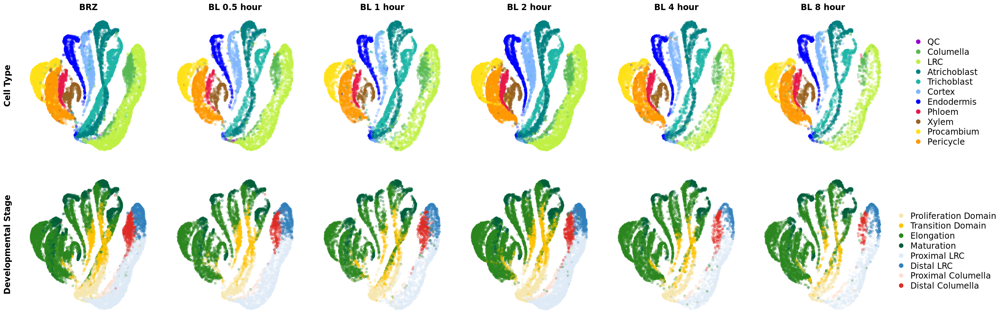

In [13]:
options(repr.plot.width=24, repr.plot.height=8)
(p1 | p2 | p3 | p4 | p5 | p6)/ (p7 | p8 | p9 | p10 | p11 | p12)+ plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))

In [15]:
margin <- c(-50,-50,-50,-50)

In [16]:
WOTCTTZ <- "WOT_Cortex"
dat_WOT = left_join(umap_br, anno_br, by="cell")
      dat_WOT = left_join(dat_WOT, gene_br, by="cell")%>%
        select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name = "name",time_zone="time_zone", cell_type="cell_type", FateProb_umap=WOTCTTZ, CellWall="cell_wall")) %>% dplyr::mutate(across(FateProb_umap, ~replace_na(.x, 0)))
      
      dat_WOT$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_WOT$time_zone)
      dat_WOT$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_WOT$time_zone)
      dat_WOT$cell_type = gsub("Lateral Root Cap","LRC",dat_WOT$cell_type)
      dat_WOT$cell_type = gsub("Quiescent Center","QC",dat_WOT$cell_type)
      
      dat_WOT$time_zone = gsub("Distal Columella", "Distal",dat_WOT$time_zone) 
      dat_WOT$time_zone = gsub("Distal LRC", "Distal",dat_WOT$time_zone)
      dat_WOT$time_zone = gsub("Proximal Columella", "Proximal",dat_WOT$time_zone)
      dat_WOT$time_zone = gsub("Proximal LRC", "Proximal",dat_WOT$time_zone)

      #reorder factors
      dat_WOT$time_zone = factor(dat_WOT$time_zone,levels=c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation", "Proximal", "Distal"))
      dat_WOT$cell_type = factor(dat_WOT$cell_type , levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))
      
      min.cutoff <- as.numeric(quantile(dat_WOT$FateProb_umap[which(dat_WOT$FateProb_umap!=0)], 0.1)[1])
      max.cutoff <- as.numeric(quantile(dat_WOT$FateProb_umap[which(dat_WOT$FateProb_umap!=0)], 0.9)[2])
      min.idx <- which((dat_WOT$FateProb_umap < min.cutoff) & (dat_WOT$FateProb_umap!=0))
      max.idx <- which((dat_WOT$FateProb_umap > max.cutoff) & (dat_WOT$FateProb_umap!=0))
      if (length(min.idx)>0){
        dat_WOT$FateProb_umap[min.idx]=min.cutoff
      }
      if (length(max.idx)>0){
        dat_WOT$FateProb_umap[max.idx]=max.cutoff
      }

normax <- max(dat_WOT$FateProb_umap)

p13 <- dat_WOT %>% filter (name=="BRZ") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
        scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("BRZ")+  
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.title.y = element_text(face="bold",size=rel(1.2)),
        axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),
              legend.text=element_text(size=rel(1.2)))+
        theme(legend.position="none")+xlab("")+ylab("Waddington OT\nAll Cortex Cells")
p14 <- dat_WOT %>% filter (name=="BL 0.5 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("BL 0.5 hour")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))+
  theme(legend.position="none")
p15 <- dat_WOT %>% filter (name=="BL 1 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("BL 1 hour")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))+
  theme(legend.position="none")
p16 <- dat_WOT %>% filter (name=="BL 2 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("BL 2 hour")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))+
  theme(legend.position="none")
p17 <- dat_WOT %>% filter (name=="BL 4 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("BL 4 hour")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))+
  theme(legend.position="none")
p18 <- dat_WOT %>% filter (name=="BL 8 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax), name = "FateProb") + theme_classic() + ggtitle("BL 8 hour")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))

WOTCTTZ <- "WOT_Cortex.."
dat_WOT = left_join(umap_br, anno_br, by="cell")
      dat_WOT = left_join(dat_WOT, gene_br, by="cell")%>%
        select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name = "name",time_zone="time_zone", cell_type="cell_type", FateProb_umap=WOTCTTZ, CellWall="cell_wall")) %>% dplyr::mutate(across(FateProb_umap, ~replace_na(.x, 0)))
      
      dat_WOT$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_WOT$time_zone)
      dat_WOT$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_WOT$time_zone)
      dat_WOT$cell_type = gsub("Lateral Root Cap","LRC",dat_WOT$cell_type)
      dat_WOT$cell_type = gsub("Quiescent Center","QC",dat_WOT$cell_type)
      
      dat_WOT$time_zone = gsub("Distal Columella", "Distal",dat_WOT$time_zone) 
      dat_WOT$time_zone = gsub("Distal LRC", "Distal",dat_WOT$time_zone)
      dat_WOT$time_zone = gsub("Proximal Columella", "Proximal",dat_WOT$time_zone)
      dat_WOT$time_zone = gsub("Proximal LRC", "Proximal",dat_WOT$time_zone)

      #reorder factors
      dat_WOT$time_zone = factor(dat_WOT$time_zone,levels=c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation", "Proximal", "Distal"))
      dat_WOT$cell_type = factor(dat_WOT$cell_type , levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))
      
      min.cutoff <- as.numeric(quantile(dat_WOT$FateProb_umap[which(dat_WOT$FateProb_umap!=0)], 0.1)[1])
      max.cutoff <- as.numeric(quantile(dat_WOT$FateProb_umap[which(dat_WOT$FateProb_umap!=0)], 0.9)[2])
      min.idx <- which((dat_WOT$FateProb_umap < min.cutoff) & (dat_WOT$FateProb_umap!=0))
      max.idx <- which((dat_WOT$FateProb_umap > max.cutoff) & (dat_WOT$FateProb_umap!=0))
      if (length(min.idx)>0){
        dat_WOT$FateProb_umap[min.idx]=min.cutoff
      }
      if (length(max.idx)>0){
        dat_WOT$FateProb_umap[max.idx]=max.cutoff
      }

normax <- max(dat_WOT$FateProb_umap)

p19 <- dat_WOT %>% filter (name=="BRZ") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
        scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+  
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.title.y = element_text(face="bold",size=rel(1.2)),
        axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),
              legend.text=element_text(size=rel(1.2)))+
        theme(legend.position="none")+xlab("")+ylab("Waddington OT\nCortex Cell Wall +")
p20 <- dat_WOT %>% filter (name=="BL 0.5 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))+
  theme(legend.position="none")
p21 <- dat_WOT %>% filter (name=="BL 1 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))+
  theme(legend.position="none")
p22 <- dat_WOT %>% filter (name=="BL 2 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))+
  theme(legend.position="none")
p23 <- dat_WOT %>% filter (name=="BL 4 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))+
  theme(legend.position="none")
p24 <- dat_WOT %>% filter (name=="BL 8 hour") %>% arrange(FateProb_umap) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = FateProb_umap), alpha = 0.2) +
  scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax), name = "FateProb") + theme_classic() + ggtitle("")+ xlab("")+ylab("")+ 
  theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
        axis.text.x = element_text(colour="white"),
        axis.ticks.y = element_blank(),
        axis.text.y = element_text(colour="white"),
        axis.line = element_blank(),
        legend.title=element_text(size=rel(1.2)),
        legend.text=element_text(size=rel(1.2)))

Note: Using an external vector in selections is ambiguous.
ℹ Use `all_of(WOTCTTZ)` instead of `WOTCTTZ` to silence this message.
ℹ See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.
This message is displayed once per session.



In [17]:
margin2 <- c(0.5,0,0,0.5)

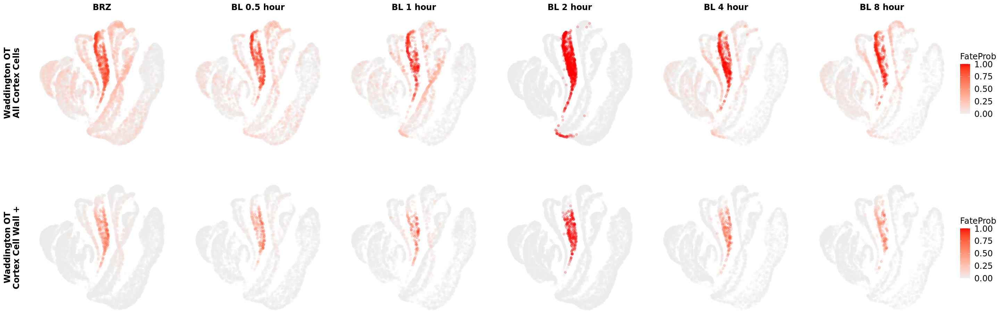

In [18]:
options(repr.plot.width=24, repr.plot.height=8)
(p13 | p14 | p15 | p16 | p17 | p18)/ (p19 | p20 | p21 | p22 | p23 | p24)+ plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))

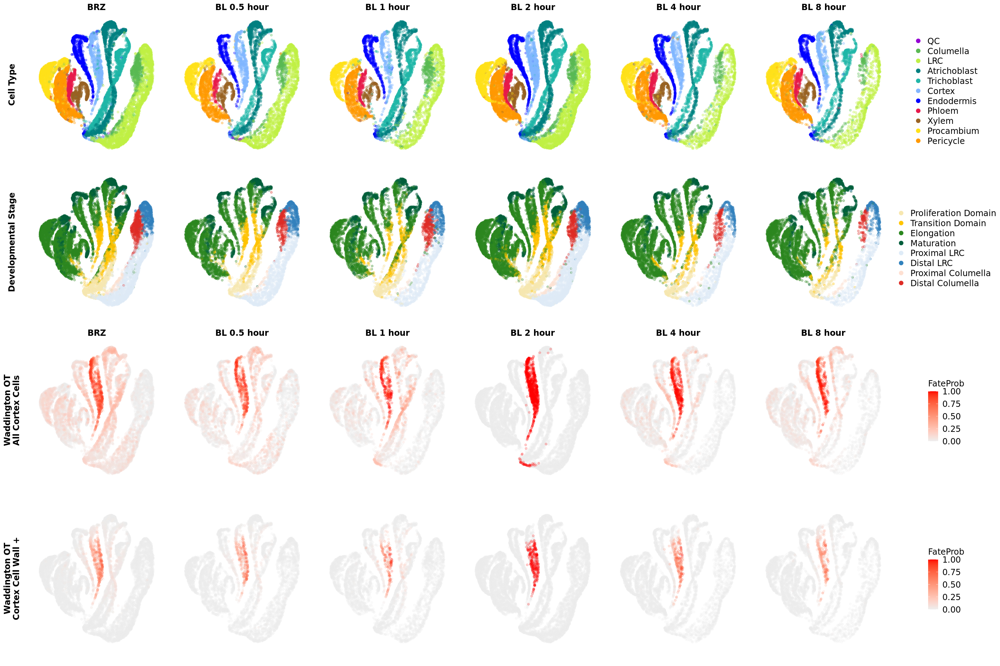

In [20]:
options(repr.plot.width=24, repr.plot.height=16)
(p1 | p2 | p3 | p4 | p5 | p6)/ (p7 | p8 | p9 | p10 | p11 | p12)/(p13 | p14 | p15 | p16 | p17 | p18)/ (p19 | p20 | p21 | p22 | p23 | p24)+ plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))

In [21]:
pdf("BR time course.pdf", height=16, width=24)
(p1 | p2 | p3 | p4 | p5 | p6)/ (p7 | p8 | p9 | p10 | p11 | p12)/(p13 | p14 | p15 | p16 | p17 | p18)/ (p19 | p20 | p21 | p22 | p23 | p24)+ plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))
dev.off()

png 
  2

## gtl1 df1

In [22]:
margin <- c(-50,-50,-50,-50)

In [23]:
dat_gtl = left_join(umap_gtl, anno_gtl, by="cell")

dat_gtl$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_gtl$time_zone)
dat_gtl$cell_type = gsub("Lateral Root Cap","LRC",dat_gtl$cell_type)
dat_gtl$cell_type = gsub("Quiescent Center","QC",dat_gtl$cell_type)

#reorder factors
dat_gtl$time_zone = factor(dat_gtl$time_zone, levels=rev(c("Distal Columella","Proximal Columella","Distal LRC","Proximal LRC","Maturation","Elongation", "Transition Domain", "Proliferation Domain"))) 
dat_gtl$cell_type = factor(dat_gtl$cell_type, levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))

p1 <- dat_gtl %>% filter (name=="WT") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("WT")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("Cell Type")
p2 <- dat_gtl %>% filter (name=="gtl1-1") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("gtl1")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold.italic"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("")
p3 <- dat_gtl %>% filter (name=="df1-1") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("df1")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold.italic"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ ylab("")
p4 <- dat_gtl %>% filter (name=="gtl1-1 df1-1") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = cell_type), alpha = 0.33)+
        scale_color_manual(name="",values=c("#9400d3","#5ab953", "#bfef45", "#008080", "#21B6A8", "#82b6ff", "#0000FF","#e6194b", "#9a6324", "#ffe119", "#ff9900"))+ 
        ggtitle("gtl1 df1")+
        theme_classic()+
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold.italic"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)))+
        guides(colour = guide_legend(override.aes = list(size=3,alpha = 1)))+
        xlab("")+ylab("")
p5 <- dat_gtl %>% filter (name=="WT") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        ggtitle("")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("Developmental Stage")
p6 <- dat_gtl %>% filter (name=="gtl1-1") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        ggtitle("")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold.italic"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("")
p7 <- dat_gtl %>% filter (name=="df1-1") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        ggtitle("")+
        theme_classic() + 
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold.italic"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank(),legend.position = "none")+
        xlab("")+ylab("")
p8 <- dat_gtl %>% filter (name=="gtl1-1 df1-1") %>% ggplot(aes(UMAP_1, UMAP_2))+ geom_point(aes(colour = time_zone), alpha = 0.33)+
        scale_color_manual(name="",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+ 
        ggtitle("")+
        theme_classic()+
        theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold.italic"),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)))+
        guides(colour = guide_legend(override.aes = list(size=3,alpha = 1)))+
        xlab("")+ylab("")

gtl_geneID <- "AT1G27740"
  
geneName <- features$V2[which(features$V1==gtl_geneID)]
gene_gtl <- read.csv(paste0("./atlas_gene_expression_data/11S_gtl1_normdata_",gtl_geneID,".csv.bz2"))
dat_gtl = left_join(umap_gtl, anno_gtl, by="cell")
dat_gtl = left_join(dat_gtl, gene_gtl, by="cell")%>%
 select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name = "name",time_zone="time_zone", cell_type="cell_type", NormExp=gtl_geneID)) %>% 
 dplyr::mutate(across(NormExp, ~replace_na(.x, 0)))

min.cutoff <- as.numeric(quantile(dat_gtl$NormExp[which(dat_gtl$NormExp!=0)], 0.1)[1])
max.cutoff <- as.numeric(quantile(dat_gtl$NormExp[which(dat_gtl$NormExp!=0)], 0.9)[2])
min.idx <- which((dat_gtl$NormExp < min.cutoff) & (dat_gtl$NormExp!=0))
max.idx <- which((dat_gtl$NormExp > max.cutoff) & (dat_gtl$NormExp!=0))
if (length(min.idx)>0){
  dat_gtl$NormExp[min.idx]=min.cutoff
}
if (length(max.idx)>0){
  dat_gtl$NormExp[max.idx]=max.cutoff
}

dat_gtl$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_gtl$time_zone)
dat_gtl$cell_type = gsub("Lateral Root Cap","LRC",dat_gtl$cell_type)
dat_gtl$cell_type = gsub("Quiescent Center","QC",dat_gtl$cell_type)

#reorder factors
dat_gtl$time_zone = factor(dat_gtl$time_zone, levels=rev(c("Distal Columella","Proximal Columella","Distal LRC","Proximal LRC","Maturation","Elongation", "Transition Domain", "Proliferation Domain"))) 
dat_gtl$cell_type = factor(dat_gtl$cell_type, levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))
dat_gtl$tc <- paste0(dat_gtl$time_zone,"_",dat_gtl$cell_type)
dat_gtl$ntc <- paste0(dat_gtl$name,"_",dat_gtl$tc)

normax <- max(dat_gtl$NormExp)

p9 <- dat_gtl %>% filter (name=="WT") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+  
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank())+
          theme(legend.position="none")+
        xlab("")+ylab("RSL4 Expression")
p10 <- dat_gtl %>% filter (name=="gtl1-1") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+  
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank())+
          theme(legend.position="none")+
        xlab("")+ylab("")
p11 <- dat_gtl %>% filter (name=="df1-1") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+  
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank())+
          theme(legend.position="none")+
        xlab("")+ylab("")
p12 <- dat_gtl %>% filter (name=="gtl1-1 df1-1") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax), name = "NormExp") + theme_classic() + ggtitle("")+ xlab("")+ylab("")+ 
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
                axis.text.x = element_text(colour="white"),
                axis.ticks.y = element_blank(),
                axis.text.y = element_text(colour="white"),
                axis.line = element_blank(),
                legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)))


gtl_geneID <- "AT5G64620"
  
geneName <- features$V2[which(features$V1==gtl_geneID)]
gene_gtl <- read.csv(paste0("./atlas_gene_expression_data/11S_gtl1_normdata_",gtl_geneID,".csv.bz2"))
dat_gtl = left_join(umap_gtl, anno_gtl, by="cell")
dat_gtl = left_join(dat_gtl, gene_gtl, by="cell")%>%
 select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name = "name",time_zone="time_zone", cell_type="cell_type", NormExp=gtl_geneID)) %>% 
 dplyr::mutate(across(NormExp, ~replace_na(.x, 0)))

min.cutoff <- as.numeric(quantile(dat_gtl$NormExp[which(dat_gtl$NormExp!=0)], 0.1)[1])
max.cutoff <- as.numeric(quantile(dat_gtl$NormExp[which(dat_gtl$NormExp!=0)], 0.9)[2])
min.idx <- which((dat_gtl$NormExp < min.cutoff) & (dat_gtl$NormExp!=0))
max.idx <- which((dat_gtl$NormExp > max.cutoff) & (dat_gtl$NormExp!=0))
if (length(min.idx)>0){
  dat_gtl$NormExp[min.idx]=min.cutoff
}
if (length(max.idx)>0){
  dat_gtl$NormExp[max.idx]=max.cutoff
}

dat_gtl$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_gtl$time_zone)
dat_gtl$cell_type = gsub("Lateral Root Cap","LRC",dat_gtl$cell_type)
dat_gtl$cell_type = gsub("Quiescent Center","QC",dat_gtl$cell_type)

#reorder factors
dat_gtl$time_zone = factor(dat_gtl$time_zone, levels=rev(c("Distal Columella","Proximal Columella","Distal LRC","Proximal LRC","Maturation","Elongation", "Transition Domain", "Proliferation Domain"))) 
dat_gtl$cell_type = factor(dat_gtl$cell_type, levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))
dat_gtl$tc <- paste0(dat_gtl$time_zone,"_",dat_gtl$cell_type)
dat_gtl$ntc <- paste0(dat_gtl$name,"_",dat_gtl$tc)

normax <- max(dat_gtl$NormExp)

p13 <- dat_gtl %>% filter (name=="WT") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+  
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.title.y = element_text(face="bold",size=rel(1.2)),
              axis.line = element_blank())+
          theme(legend.position="none")+
        xlab("")+ylab("C/VIF2 Expression")
p14 <- dat_gtl %>% filter (name=="gtl1-1") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+  
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank())+
          theme(legend.position="none")+
        xlab("")+ylab("")
p15 <- dat_gtl %>% filter (name=="df1-1") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax)) + theme_classic() + ggtitle("")+  
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank())+
          theme(legend.position="none")+
        xlab("")+ylab("")
p16 <- dat_gtl %>% filter (name=="gtl1-1 df1-1") %>% arrange(NormExp) %>% ggplot(aes(UMAP_1, UMAP_2)) + geom_point(aes(colour = NormExp), alpha = 0.5) +
          scale_colour_gradient(low = "#eeeeee", high = "#ff0000", limits=c(0, normax), name = "NormExp") + theme_classic() + ggtitle("")+ xlab("")+ylab("")+ 
          theme(plot.margin = unit(margin, "lines"),plot.title = element_text(hjust = 0.5, face="bold"),axis.ticks.x = element_blank(),
                axis.text.x = element_text(colour="white"),
                axis.ticks.y = element_blank(),
                axis.text.y = element_text(colour="white"),
                axis.line = element_blank(),
                legend.title=element_text(size=rel(1.2)),
                legend.text=element_text(size=rel(1.2)))


Note: Using an external vector in selections is ambiguous.
ℹ Use `all_of(gtl_geneID)` instead of `gtl_geneID` to silence this message.
ℹ See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>.
This message is displayed once per session.



In [24]:
margin2 <- c(0.5,0,0,0.5)

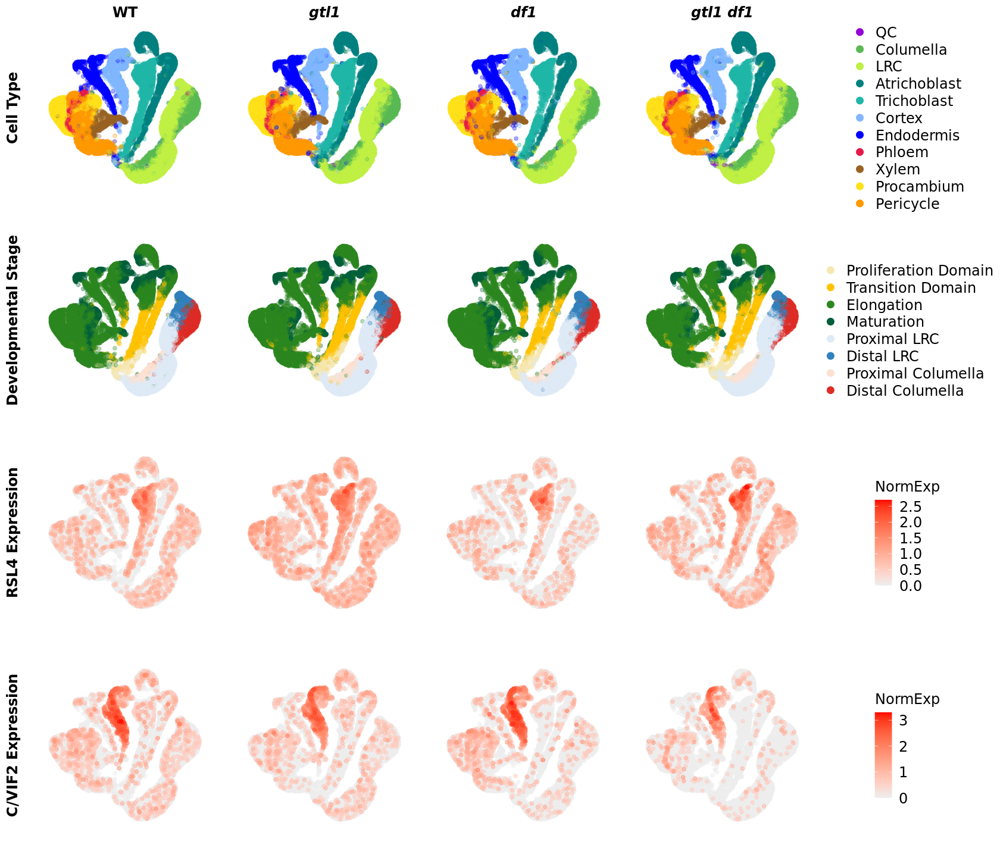

In [25]:
options(repr.plot.width=14, repr.plot.height=12)
(p1 | p2 | p3 | p4 )/ (p5 | p6 | p7 | p8 )/(p9 | p10 | p11 | p12 )/ (p13 | p14 | p15 | p16 )+ plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))

In [26]:
pdf("Figure_gtl1_df1.pdf", height=12, width=14)
(p1 | p2 | p3 | p4 )/ (p5 | p6 | p7 | p8 )/(p9 | p10 | p11 | p12 )/ (p13 | p14 | p15 | p16 )+ plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))
dev.off()

png 
  2

## Heat Maps

In [50]:
gtl_geneID <- "AT1G27740"      
geneName <- features$V2[which(features$V1==gtl_geneID)]
gene_gtl <- read.csv(paste0("./atlas_gene_expression_data/11S_gtl1_normdata_",gtl_geneID,".csv.bz2"))
dat_gtl = left_join(umap_gtl, anno_gtl, by="cell")
dat_gtl = left_join(dat_gtl, gene_gtl, by="cell")%>%
  select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name = "name",time_zone="time_zone", cell_type="cell_type", NormExp=gtl_geneID)) %>% 
  dplyr::mutate(across(NormExp, ~replace_na(.x, 0)))

dat_gtl$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_gtl$time_zone)
dat_gtl$cell_type = gsub("Lateral Root Cap","LRC",dat_gtl$cell_type)
dat_gtl$cell_type = gsub("Quiescent Center","QC",dat_gtl$cell_type)

dat_gtl$time_zone = gsub("Distal Columella", "Distal",dat_gtl$time_zone) 
dat_gtl$time_zone = gsub("Distal LRC", "Distal",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal Columella", "Proximal",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal LRC", "Proximal",dat_gtl$time_zone)

#reorder factors
dat_gtl$time_zone = factor(dat_gtl$time_zone,levels=c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation", "Proximal", "Distal"))
dat_gtl$cell_type = factor(dat_gtl$cell_type , levels=rev(c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle")))

dat_gtl <- dat_gtl %>% filter(cell_type=="Trichoblast")

heat_gtl <- expand.grid(X=c("WT", "gtl1-1", "df1-1", "gtl1-1 df1-1"), 
                                Y=c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation"))
        heat_gtl$X <- as.character(heat_gtl$X)
        heat_gtl$Y <- as.character(heat_gtl$Y)
        z <- c()
        for (i in 1:nrow(heat_gtl)) {
          idx <- which(dat_gtl$name== heat_gtl$X[i] & dat_gtl$time_zone == heat_gtl$Y[i])
          z <- c(z, mean(dat_gtl$NormExp[idx]))
        }
        heat_gtl$Z <- z
        heat_gtl$Y = factor(heat_gtl$Y,levels=c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation"))
        heat_gtl$X = factor(heat_gtl$X , levels=c("WT", "gtl1-1", "df1-1", "gtl1-1 df1-1"))
        p1 <- ggplot(heat_gtl, aes(X, Y, fill= Z)) + 
          geom_tile() +
          scale_fill_viridis_c() +
          ggtitle("RSL4 Trichoblast Expression")+
          labs(fill = "AvgExp") + xlab("") + ylab("")+ 
          theme_classic() + theme(axis.text.x = element_text(size=rel(1.2), angle=45, hjust=1, face="bold"),
                                  axis.text.y = element_text(size=rel(1.2), face="bold"),
                                  plot.title = element_text(hjust = 0.5, face="bold", size=rel(1.2)),
                                 legend.title=element_text(size=rel(1.2), face="bold"))

gtl_geneID <- "AT5G64620"      
geneName <- features$V2[which(features$V1==gtl_geneID)]
gene_gtl <- read.csv(paste0("./atlas_gene_expression_data/11S_gtl1_normdata_",gtl_geneID,".csv.bz2"))
dat_gtl = left_join(umap_gtl, anno_gtl, by="cell")
dat_gtl = left_join(dat_gtl, gene_gtl, by="cell")%>%
  select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name = "name",time_zone="time_zone", cell_type="cell_type", NormExp=gtl_geneID)) %>% 
  dplyr::mutate(across(NormExp, ~replace_na(.x, 0)))

dat_gtl$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_gtl$time_zone)
dat_gtl$cell_type = gsub("Lateral Root Cap","LRC",dat_gtl$cell_type)
dat_gtl$cell_type = gsub("Quiescent Center","QC",dat_gtl$cell_type)

dat_gtl$time_zone = gsub("Distal Columella", "Distal",dat_gtl$time_zone) 
dat_gtl$time_zone = gsub("Distal LRC", "Distal",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal Columella", "Proximal",dat_gtl$time_zone)
dat_gtl$time_zone = gsub("Proximal LRC", "Proximal",dat_gtl$time_zone)

#reorder factors
dat_gtl$time_zone = factor(dat_gtl$time_zone,levels=c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation", "Proximal", "Distal"))
dat_gtl$cell_type = factor(dat_gtl$cell_type , levels=rev(c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle")))

dat_gtl <- dat_gtl %>% filter(cell_type=="Cortex")

heat_gtl <- expand.grid(X=c("WT", "gtl1-1", "df1-1", "gtl1-1 df1-1"), 
                                Y=c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation"))
        heat_gtl$X <- as.character(heat_gtl$X)
        heat_gtl$Y <- as.character(heat_gtl$Y)
        z <- c()
        for (i in 1:nrow(heat_gtl)) {
          idx <- which(dat_gtl$name== heat_gtl$X[i] & dat_gtl$time_zone == heat_gtl$Y[i])
          z <- c(z, mean(dat_gtl$NormExp[idx]))
        }
        heat_gtl$Z <- z
        heat_gtl$Y = factor(heat_gtl$Y,levels=c("Proliferation Domain", "Transition Domain", "Elongation", "Maturation"))
        heat_gtl$X = factor(heat_gtl$X , levels=c("WT", "gtl1-1", "df1-1", "gtl1-1 df1-1"))
        p2 <- ggplot(heat_gtl, aes(X, Y, fill= Z)) + 
          geom_tile() +
          scale_fill_viridis_c() +
          ggtitle("C/VIF2 Cortex Expression")+
          labs(fill = "AvgExp") + xlab("") + ylab("")+ 
          theme_classic() + theme(axis.text.x = element_text(size=rel(1.2), angle=45, hjust=1, face="bold"),
                                  axis.text.y = element_text(size=rel(1.2), face="bold"),
                                  plot.title = element_text(hjust = 0.5, face="bold", size=rel(1.2)), 
                                 legend.title=element_text(size=rel(1.2), face="bold"))

In [51]:
margin2 <- c(0.5,0,0,0.5)

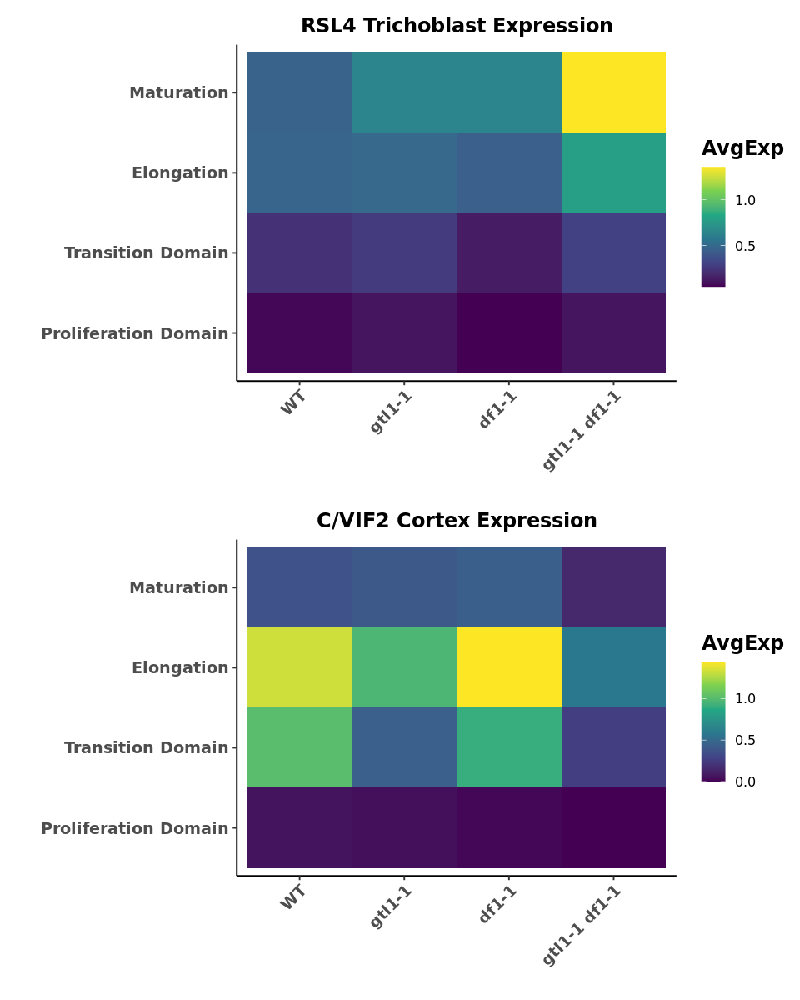

In [52]:
options(repr.plot.width=8, repr.plot.height=10)
p1/p2+ plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))

In [53]:
pdf("Heat_Maps.pdf", height=10, width=8)
p1/p2 + plot_annotation(theme = theme(plot.margin = unit(margin2, "lines")))
dev.off()

png 
  2

## Triangle plots

In [55]:
geneName <- features$V2[which(features$V1=="AT5G15150")]
gene_br <- read.csv(paste0("./atlas_gene_expression_data/14S_BR_normdata_","AT5G15150",".csv.bz2"))
dat_WOT = left_join(umap_br, anno_br, by="cell")
dat_WOT = left_join(dat_WOT, gene_br, by="cell")%>%
  select(c(cell="cell", UMAP_1="UMAP_1", UMAP_2="UMAP_2", name 
           = "name",time_zone="time_zone", cell_type="cell_type", NormExp="AT5G15150", CellWall="cell_wall", FateProb1="WOT_Cortex...1", FateProb2="WOT_Cortex..")) %>% 
  dplyr::mutate(across(NormExp, ~replace_na(.x, 0)))%>% dplyr::mutate(across(CellWall, ~replace_na(.x, 0)))
  
dat_WOT$time_zone = gsub("Distal Lateral Root Cap","Distal LRC",dat_WOT$time_zone)
dat_WOT$time_zone = gsub("Proximal Lateral Root Cap","Proximal LRC",dat_WOT$time_zone)
dat_WOT$cell_type = gsub("Lateral Root Cap","LRC",dat_WOT$cell_type)
dat_WOT$cell_type = gsub("Quiescent Center","QC",dat_WOT$cell_type)
#reorder factors
dat_WOT$time_zone = factor(dat_WOT$time_zone, levels=rev(c("Distal Columella","Proximal Columella","Distal LRC","Proximal LRC","Maturation","Elongation", "Transition Domain", "Proliferation Domain"))) 
dat_WOT$cell_type = factor(dat_WOT$cell_type, levels=c("QC","Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle"))

min.cutoff <- as.numeric(quantile(dat_WOT$NormExp[which(dat_WOT$NormExp!=0)], c(0.1,0.9))[1])
      max.cutoff <- as.numeric(quantile(dat_WOT$NormExp[which(dat_WOT$NormExp!=0)], c(0.1, 0.9))[2])
      min.idx <- which((dat_WOT$NormExp < min.cutoff) & (dat_WOT$NormExp!=0))
      max.idx <- which((dat_WOT$NormExp > max.cutoff) & (dat_WOT$NormExp!=0))
      if (length(min.idx)>0){
        dat_WOT$NormExp[min.idx]=min.cutoff
      }
      if (length(max.idx)>0){
        dat_WOT$NormExp[max.idx]=max.cutoff
      }

min.cutoff <- as.numeric(quantile(dat_WOT$CellWall[which(dat_WOT$CellWall!=0)], c(0.1,0.9))[1])
      max.cutoff <- as.numeric(quantile(dat_WOT$CellWall[which(dat_WOT$CellWall!=0)], c(0.1, 0.9))[2])
      min.idx <- which((dat_WOT$CellWall < min.cutoff) & (dat_WOT$CellWall!=0))
      max.idx <- which((dat_WOT$CellWall > max.cutoff) & (dat_WOT$CellWall!=0))
      if (length(min.idx)>0){
        dat_WOT$CellWall[min.idx]=min.cutoff
      }
      if (length(max.idx)>0){
        dat_WOT$CellWall[max.idx]=max.cutoff
      }

font_size=14

normax <- max(dat_WOT$CellWall)
normin <- min(dat_WOT$CellWall)
p1 <- dat_WOT %>% filter(name=="BRZ") %>% filter(time_zone=="Proliferation Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p2 <- dat_WOT %>% filter(name=="BL 0.5 hour") %>% filter(time_zone=="Proliferation Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p3 <- dat_WOT %>% filter(name=="BL 1 hour") %>% filter(time_zone=="Proliferation Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p4 <- dat_WOT %>% filter(name=="BL 2 hour") %>% filter(time_zone=="Proliferation Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  annotate(geom  = 'text',
              x     = c(0.5),
              y     = c(0.5),
              z     = c(0.5),
              angle = c(0),
              vjust = c(1.5),
              label = "Reference",
              color = c("black"),
              size=6)+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p5 <- dat_WOT %>% filter(name=="BL 4 hour") %>% filter(time_zone=="Proliferation Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p6 <- dat_WOT %>% filter(name=="BL 8 hour") %>% filter(time_zone=="Proliferation Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p7 <- dat_WOT %>% filter(name=="BRZ") %>% filter(time_zone=="Transition Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p8 <- dat_WOT %>% filter(name=="BL 0.5 hour") %>% filter(time_zone=="Transition Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p9 <- dat_WOT %>% filter(name=="BL 1 hour") %>% filter(time_zone=="Transition Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p10 <- dat_WOT %>% filter(name=="BL 2 hour") %>% filter(time_zone=="Transition Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  annotate(geom  = 'text',
              x     = c(0.5),
              y     = c(0.5),
              z     = c(0.5),
              angle = c(0),
              vjust = c(1.5),
              label = "Reference",
              color = c("black"),
              size=6)+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p11 <- dat_WOT %>% filter(name=="BL 4 hour") %>% filter(time_zone=="Transition Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p12 <- dat_WOT %>% filter(name=="BL 8 hour") %>% filter(time_zone=="Transition Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p13 <- dat_WOT %>% filter(name=="BRZ") %>% filter(time_zone=="Elongation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p14 <- dat_WOT %>% filter(name=="BL 0.5 hour") %>% filter(time_zone=="Elongation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p15 <- dat_WOT %>% filter(name=="BL 1 hour") %>% filter(time_zone=="Elongation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p16 <- dat_WOT %>% filter(name=="BL 2 hour") %>% filter(time_zone=="Elongation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  annotate(geom  = 'text',
              x     = c(0.5),
              y     = c(0.5),
              z     = c(0.5),
              angle = c(0),
              vjust = c(1.5),
              label = "Reference",
              color = c("black"),
              size=6)+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p17 <- dat_WOT %>% filter(name=="BL 4 hour") %>% filter(time_zone=="Elongation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p18 <- dat_WOT %>% filter(name=="BL 8 hour") %>% filter(time_zone=="Elongation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p19 <- dat_WOT %>% filter(name=="BRZ") %>% filter(time_zone=="Maturation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p20 <- dat_WOT %>% filter(name=="BL 0.5 hour") %>% filter(time_zone=="Maturation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p21 <- dat_WOT %>% filter(name=="BL 1 hour") %>% filter(time_zone=="Maturation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p22 <- dat_WOT %>% filter(name=="BL 2 hour") %>% filter(time_zone=="Maturation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  annotate(geom  = 'text',
              x     = c(0.5),
              y     = c(0.5),
              z     = c(0.5),
              angle = c(0),
              vjust = c(1.5),
              label = "Reference",
              color = c("black"),
              size=6)+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p23 <- dat_WOT %>% filter(name=="BL 4 hour") %>% filter(time_zone=="Maturation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p24 <- dat_WOT %>% filter(name=="BL 8 hour") %>% filter(time_zone=="Maturation") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")

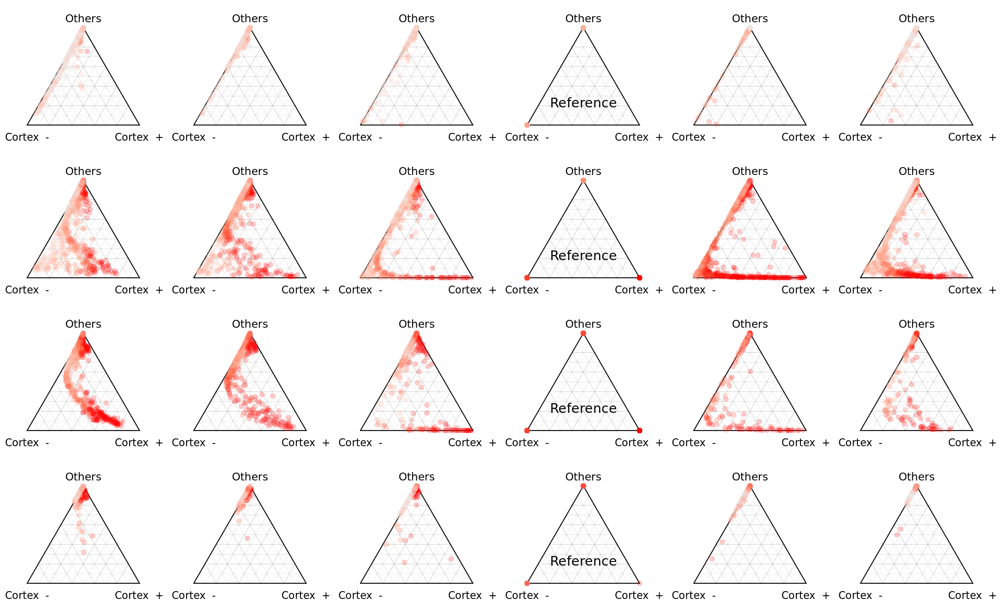

In [56]:
options(repr.plot.width=18, repr.plot.height=11)
grid.arrange(p19,p20,p21,p22,p23,p24,p13,p14,p15,p16,p17,p18,p7,p8,p9,p10,p11,p12,p1,p2,p3,p4,p5,p6, nrow=4, ncol=6, widths = c(1,1,1,1,1,1))

In [57]:
pdf("Triangle_plots_without_legend.pdf", height=11, width=18)
grid.arrange(p19,p20,p21,p22,p23,p24,p13,p14,p15,p16,p17,p18,p7,p8,p9,p10,p11,p12,p1,p2,p3,p4,p5,p6, nrow=4, ncol=6, widths = c(1,1,1,1,1,1))
dev.off()

png 
  2

In [58]:
pl <- dat_WOT %>% filter(name=="BRZ") %>% filter(time_zone=="Proliferation Domain") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=CellWall)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.33) + scale_colour_gradient(name="Cell wall signature        ",low = "#eeeeee", high = "#ff0000", limits=c(normin, normax))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)))

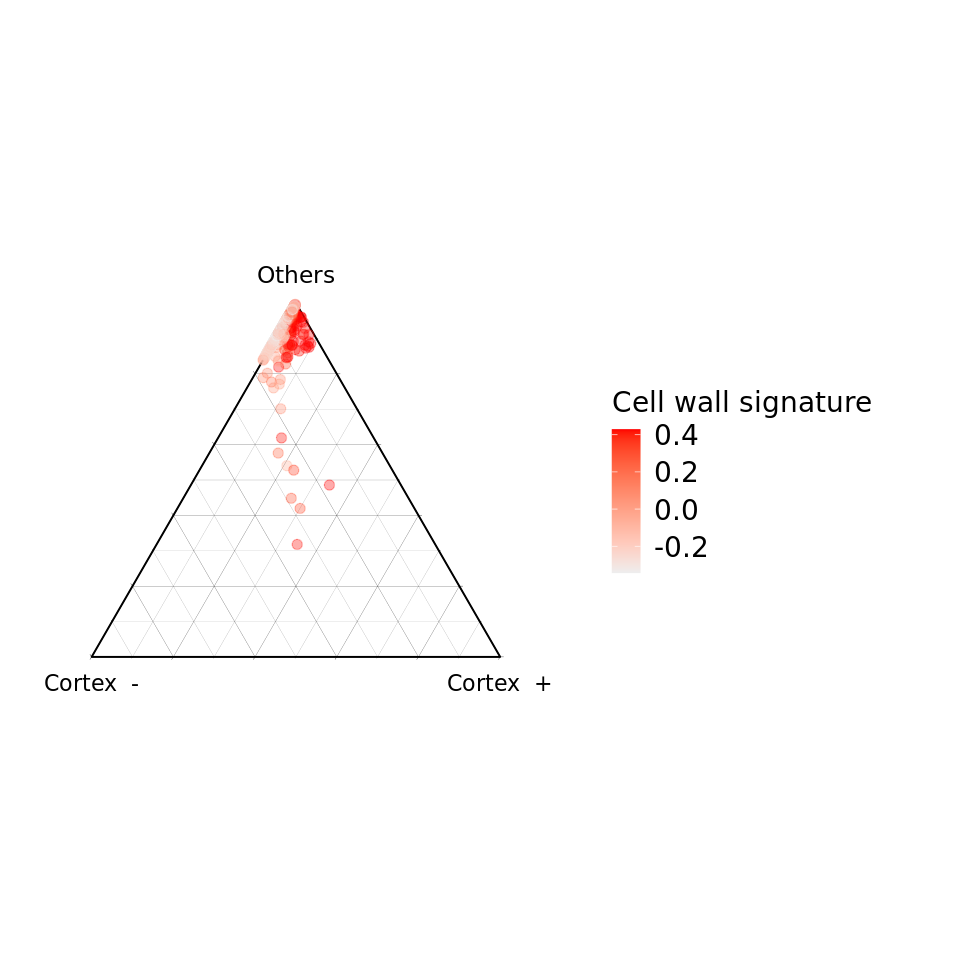

In [59]:
options(repr.plot.width=8, repr.plot.height=8)
pl

In [60]:
pdf("Triangle_plots_legend.pdf", height=8, width=8)
print(pl)
dev.off()

png 
  2

In [61]:
p1 <- dat_WOT %>% filter(name=="BRZ") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=time_zone)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_color_manual(name="Time zone",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p2 <- dat_WOT %>% filter(name=="BL 0.5 hour") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=time_zone)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+  
  geom_point(size=2.5,alpha = 0.2) + scale_color_manual(name="Time zone",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p3 <- dat_WOT %>% filter(name=="BL 1 hour") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=time_zone)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_color_manual(name="Time zone",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p4 <- dat_WOT %>% filter(name=="BL 2 hour") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=time_zone)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_color_manual(name="Time zone",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  annotate(geom  = 'text',
              x     = c(0.5),
              y     = c(0.5),
              z     = c(0.5),
              angle = c(0),
              vjust = c(1.5),
              label = "Reference",
              color = c("black"),
              size=6)+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p5 <- dat_WOT %>% filter(name=="BL 4 hour") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=time_zone)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_color_manual(name="Time zone",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)),
              legend.position="none")
p6 <- dat_WOT %>% filter(name=="BL 8 hour") %>% mutate(FateProb=1-(FateProb1+FateProb2))%>% ggtern(aes(FateProb1, FateProb, FateProb2, color=time_zone)) + 
  scale_T_continuous(name="Others",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_L_continuous(name="",limits = c(0,1), labels = c("","","","","",""))+ 
  scale_R_continuous(name="", limits = c(0,1), labels = c("","","","","",""))+ 
  geom_point(size=2.5,alpha = 0.2) + scale_color_manual(name="Time zone",values=c('#F7E7B0','#FFC400','#2B871F','#005E3B',"#deebf7", "#3182bd", '#fee0d2','#de2d26'))+
  theme_linedraw()+
  #theme_rotate(60)+
  #theme_showarrows()+
  #custom_percent(c("Others", "Cortex -", "Cortex +"))+
  #theme_hidegrid()
  annotate(geom  = 'text',
              x     = c(1,0),
              y     = c(0,0),
              z     = c(0,1),
              angle = c(0,0),
              vjust = c(2,2),
              label = paste("Cortex",c(" -"," +")),
              color = c("black","black"),
           size=font_size/3) +
  theme_nomask()+
  theme(text=element_text(size=font_size),plot.title = element_text(hjust = 0.5),axis.ticks.x = element_blank(),
              axis.text.x = element_text(colour="white"),
              axis.ticks.y = element_blank(),
              axis.text.y = element_text(colour="white"),
              axis.line = element_blank(),legend.title=element_text(size=rel(1.2)),legend.text=element_text(size=rel(1.2)))+guides(colour = guide_legend(override.aes = list(size=3,alpha = 1)))

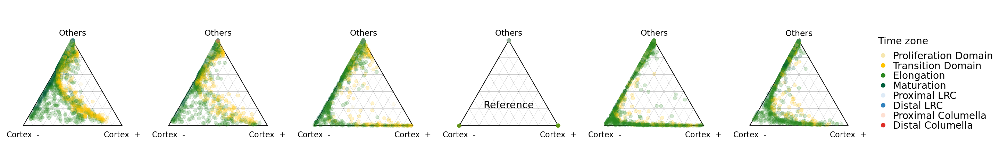

In [65]:
options(repr.plot.width=24, repr.plot.height=4)
grid.arrange(p1,p2,p3,p4,p5,p6, nrow=1, ncol=6, widths = c(1,1,1,1,1,1.88))

In [63]:
pdf("Triangle_plots_DevStage_anno_without_legend.pdf", height=4, width=24)
grid.arrange(p1,p2,p3,p4,p5,p6, nrow=1, ncol=6, widths = c(1,1,1,1,1,1.8))
dev.off()

png 
  2

## CellOracle Rank Plot

Selecting by variable



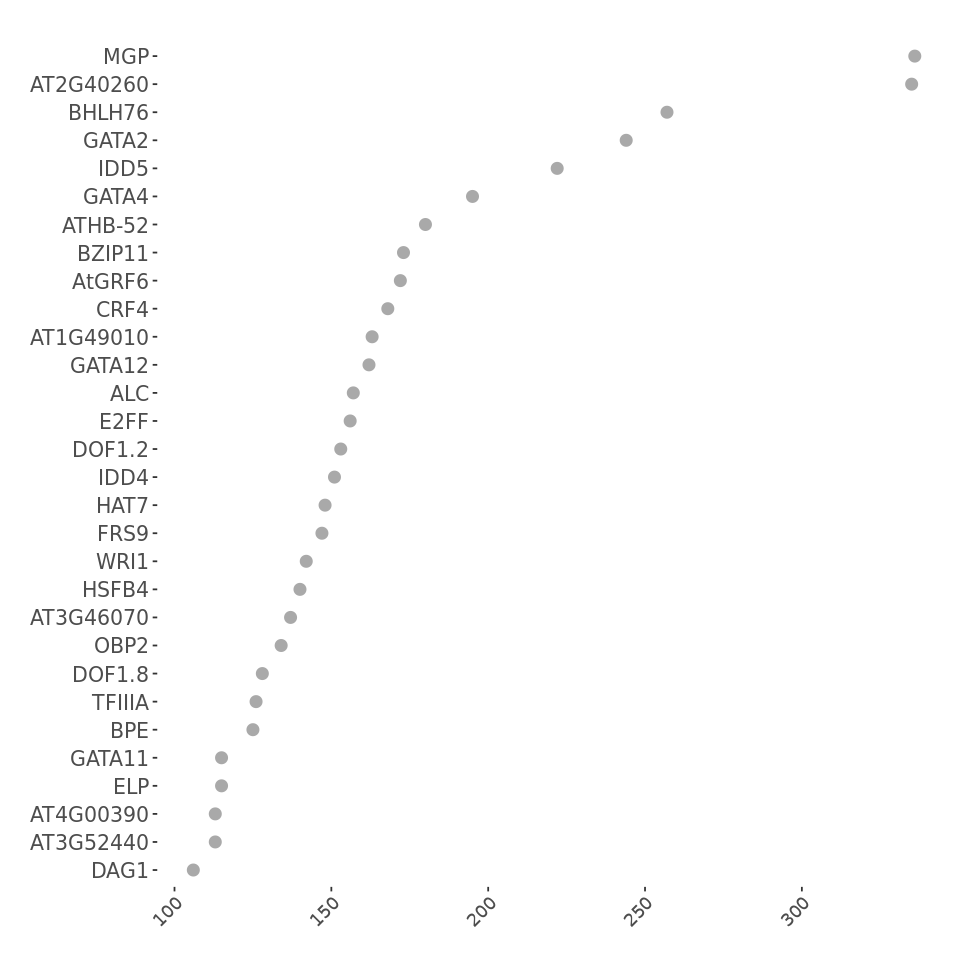

In [67]:
## Codes for plotting as in ARVEX

options(repr.plot.width=8, repr.plot.height=8)
Dat %>% filter(cluster == paste("Proliferation Domain", "Cortex", "BRZ", sep="_")) %>%  
        select(c(name="name",variable="degree_all")) %>% top_n(as.numeric(30)) %>%
        ggplot(aes(y=fct_reorder(name, variable), x=variable)) + 
        geom_point(color="darkgrey", size=3) + 
        #theme_classic() + 
        theme(panel.background = element_rect(fill = "white",
                                              colour = "white"),axis.text.x = element_text(angle=45,vjust = 1, hjust = 1,size=rel(1.2)),axis.text.y = element_text(size=rel(1.4)))+
        ggtitle("") +
        xlab("") + 
        ylab("") 